## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

### Read calibration images and fill objpoints and imgpoints for calibration

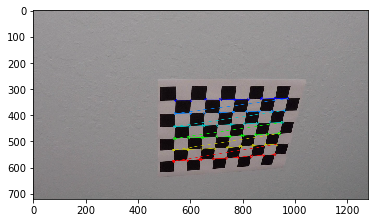

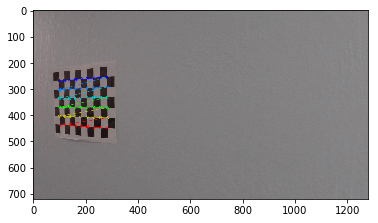

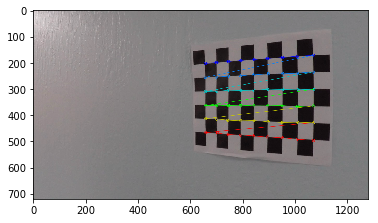

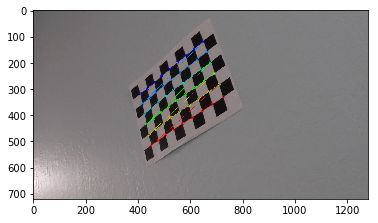

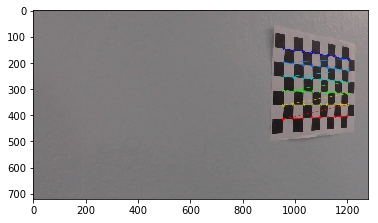

...

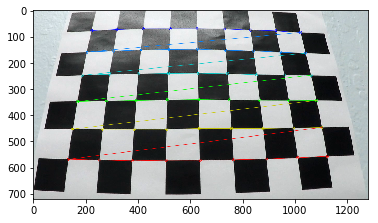

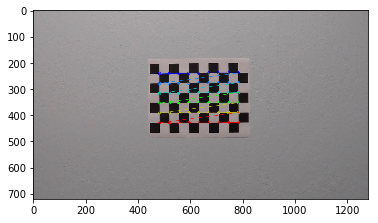

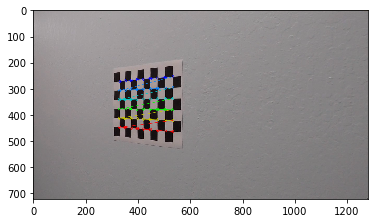

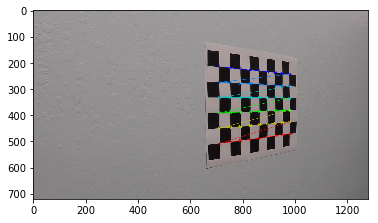

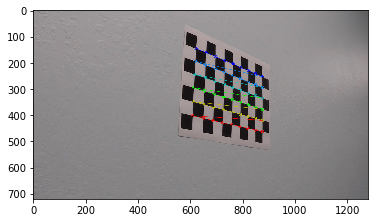

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

objpoints = []
imgpoints = []

images = glob.glob('./camera_cal/calibration*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        plt.imshow(img)
        plt.show()

### Helper Functions

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline


def plot_images(imgs, titles, file_path=None, show=True):
    n = len(imgs)
    if n == 1:
        plot_image(imgs[0], titles[0], file_path, show)
        return

    f, axs = plt.subplots(1, n, figsize=(20, 10))
    for i in range(n):
        axs[i].imshow(imgs[i], cmap='gray')
        axs[i].set_title(titles[i], fontsize=30)

    if file_path is not None:
        f.savefig('./writeup_imgs/' + file_path)

    if show is True:
        plt.show()

    plt.close()


def plot_image(img, title, file_path=None, show=True):
    f, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(img, cmap='gray')
    ax.set_title(title, fontsize=30)

    if file_path is not None:
        f.savefig('./writeup_imgs/' + file_path)

    if show is True:
        plt.show()

    plt.close()


### Calibrate camera and def undistort method for an image

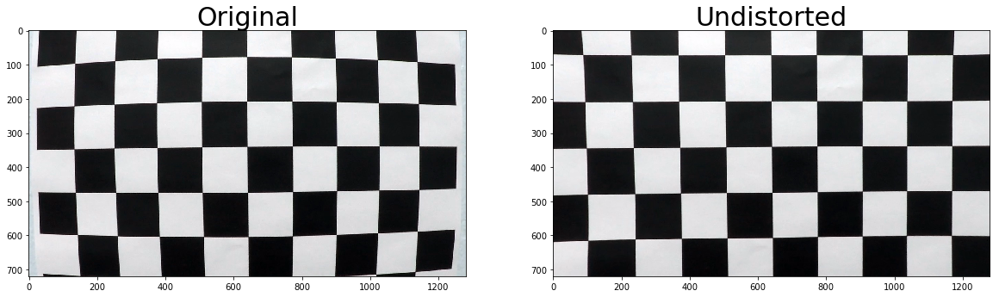

In [10]:
import pickle
import matplotlib.image as mpimg

img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/dist_pickle.p", "wb"))

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

dst = undistort(img)
    
plot_images([img, dst], ['Original', 'Undistorted'], 'undist.jpg')

---
## Next, I'll define a handful of helper functions and initialize camera from the pickle file

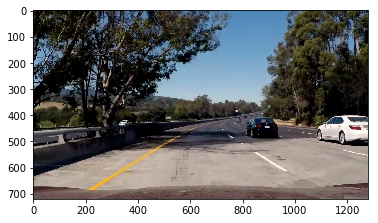

loaded


In [146]:
import cv2
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline


def plot_images(imgs, titles, file_path=None, show=True):
    n = len(imgs)
    if n == 1:
        plot_image(imgs[0], titles[0], file_path, show)
        return

    f, axs = plt.subplots(1, n, figsize=(20, 10))
    for i in range(n):
        axs[i].imshow(imgs[i], cmap='gray')
        axs[i].set_title(titles[i], fontsize=30)

    if file_path is not None:
        f.savefig('./writeup_imgs/' + file_path)

    if show is True:
        plt.show()

    plt.close()


def plot_image(img, title, file_path=None, show=True):
    f, ax = plt.subplots(figsize=(20, 10))
    ax.imshow(img, cmap='gray')
    ax.set_title(title, fontsize=30)

    if file_path is not None:
        f.savefig('./writeup_imgs/' + file_path)

    if show is True:
        plt.show()

    plt.close()
    
    
def binary_thresh(img, thresh=(0, 255)):
    binary = np.zeros_like(img)
    binary[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary


def draw_region(img, pts, color=[255, 0, 0], lwidth=5):
    img = np.copy(img)
    cv2.line(img, pts[0], pts[1], color, lwidth)
    cv2.line(img, pts[1], pts[2], color, lwidth)
    cv2.line(img, pts[2], pts[3], color, lwidth)
    cv2.line(img, pts[3], pts[0], color, lwidth)
    return img

# load camera calibration details
dist_pickle = pickle.load(open('./camera_cal/dist_pickle.p', 'rb'))
mtx = dist_pickle['mtx']
dist = dist_pickle['dist']

# load test image
img = mpimg.imread('./test_images/test5.jpg')
plt.imshow(img)
plt.show()

print('loaded')

---
## Next, I'll combine various thresholding operations to better detect lane lines

### Define and test color thresholding methods

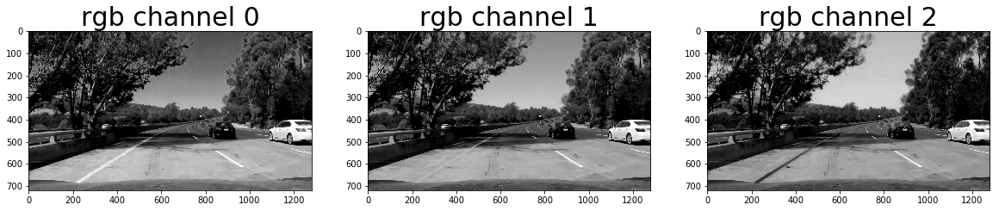

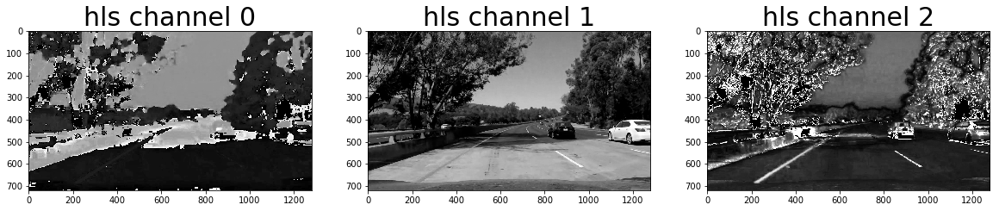

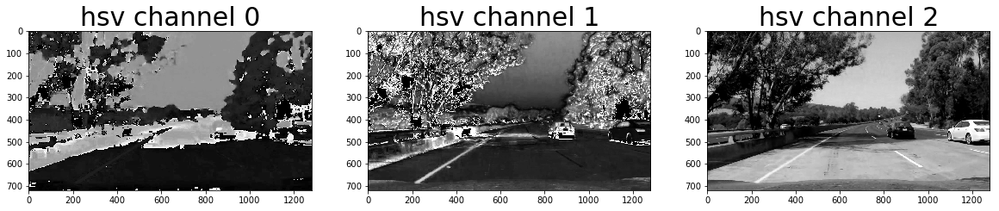

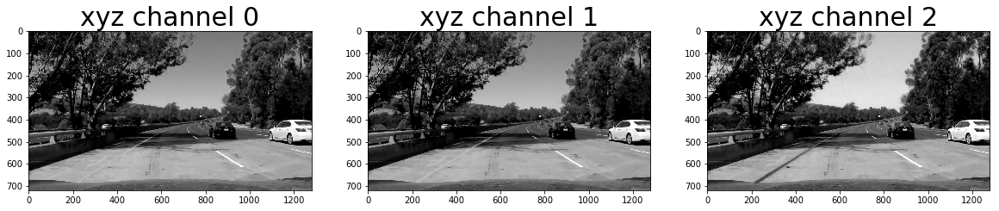

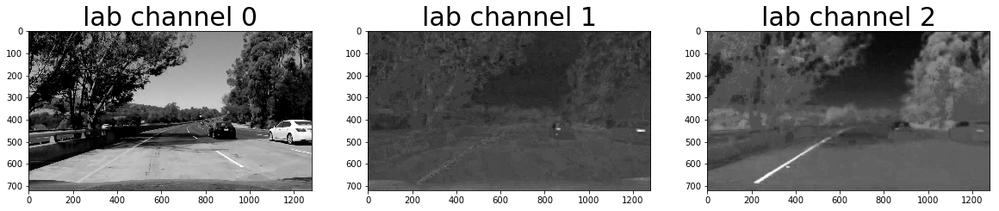

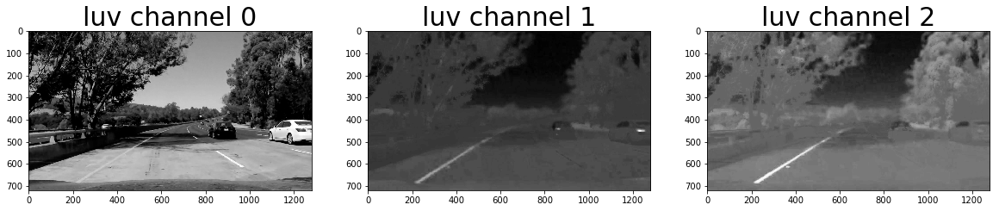

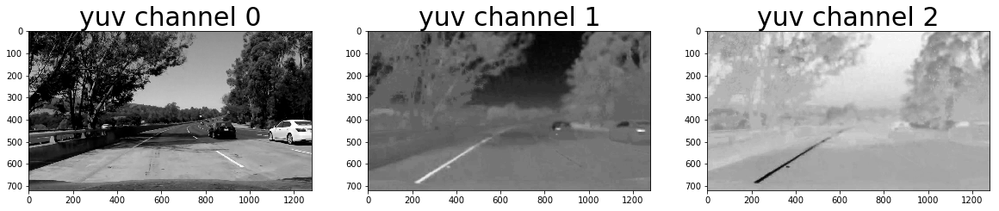

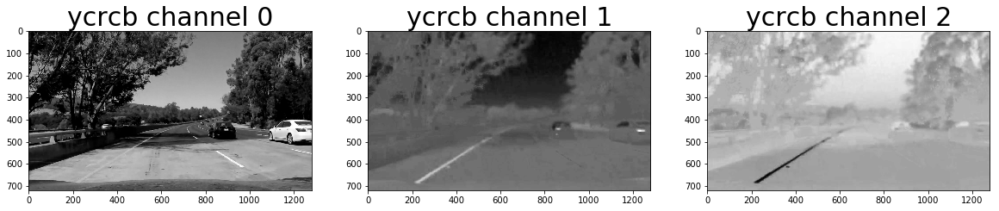

In [147]:
def explore_color_space(img, title):
    imgs = []
    titles = []
    for i in range(3):
        c = img[:,:,i]
        imgs.append(c)
        titles.append(title + ' channel ' + str(i))
    plot_images(imgs, titles, 'explore_color_space_'+title+'.jpg')
    
explore_color_space(img, 'rgb')

des = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
explore_color_space(des, 'hls')

des = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
explore_color_space(des, 'hsv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2XYZ)
explore_color_space(des, 'xyz')

des = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
explore_color_space(des, 'lab')

des = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
explore_color_space(des, 'luv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
explore_color_space(des, 'yuv')

des = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
explore_color_space(des, 'ycrcb')

### RGB: R Channel

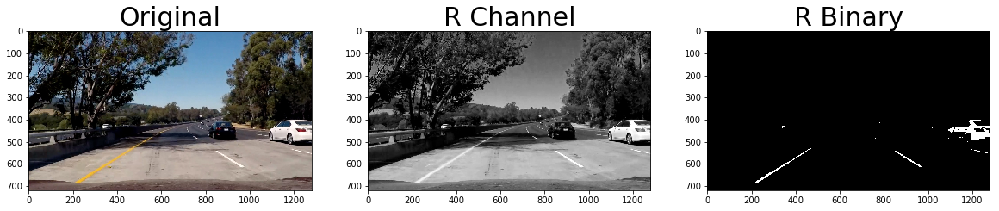

In [148]:
r = img[:, :, 0]
r_bin = binary_thresh(r, (225, 255))
plot_images([img, r, r_bin], ['Original', 'R Channel', 'R Binary'], 'bin_r.jpg')

### HSV: V Channel

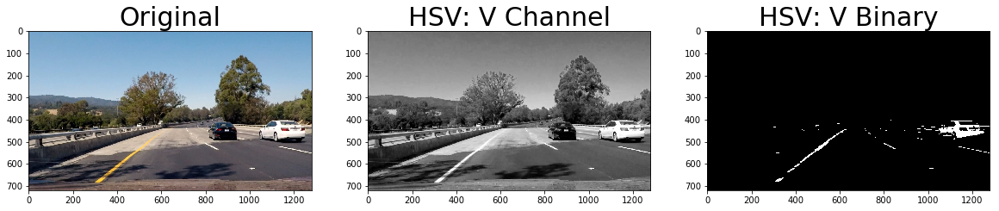

In [31]:
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
v = hsv[:, :, 2]
v_bin = binary_thresh(v, (225, 255))
plot_images([img, des, des_bin], ['Original', 'HSV: V Channel', 'HSV: V Binary'], 'bin_v.jpg')

### LAB: B Channel

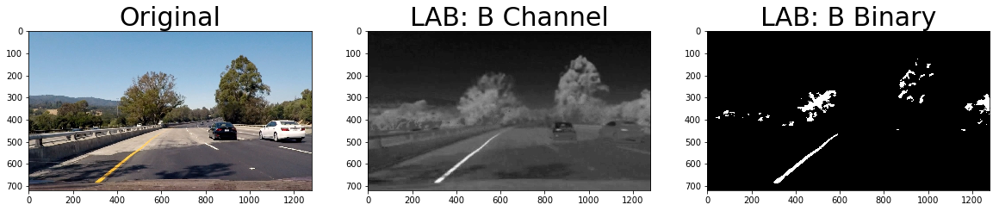

In [32]:
lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
b = lab[:,:,2]
b_bin = binary_thresh(b, (150, 255))
plot_images([img, b, b_bin], ['Original', 'LAB: B Channel', 'LAB: B Binary'], 'bin_b.jpg')

### Define color binary function to combine binaries from various color channels to get single binary image

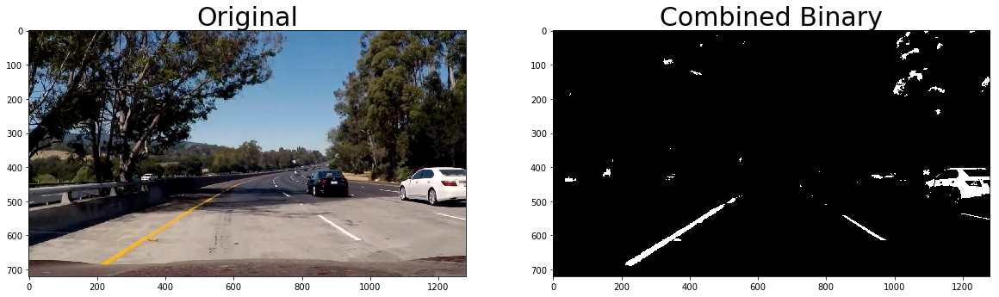

In [153]:
def color_binary(img):
    r_thresh = (225, 255)
    v_thresh = (225, 255)
    b_thresh = (150, 255)

    r = img[:, :, 0]
    r_bin = binary_thresh(r, r_thresh)

    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v = hsv[:, :, 2]
    v_bin = binary_thresh(v, v_thresh)

    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    b = lab[:, :, 2]
    b_bin = binary_thresh(b, b_thresh)

    combined = np.zeros_like(r_bin)
    combined[(r_bin == 1) | (v_bin == 1) | (b_bin == 1)] = 1
    return combined

des = color_binary(img)
plot_images([img, des], ['Original', 'Combined Binary'], 'bin_color.jpg')

### Define and test sobel thresholding methods

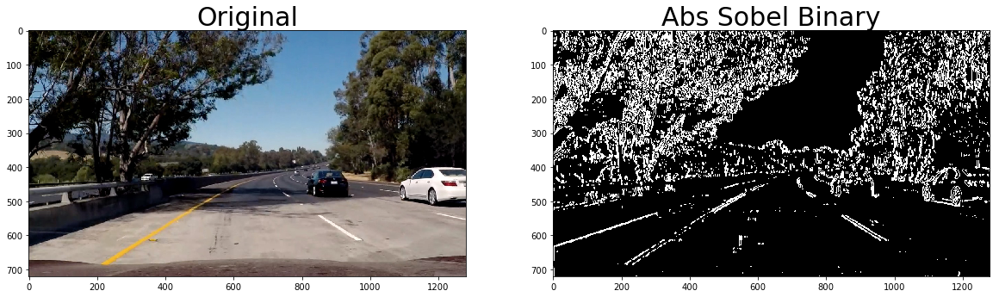

In [154]:
def sobel_abs_grad_binary(img, orient='x', sobel_kernel=15, thresh=(20, 100)):
    r = img[:, :, 0]
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(cv2.Sobel(r, cv2.CV_64F, orient == 'x', orient == 'y', ksize=sobel_kernel))
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude is between thresh
    binary_output = binary_thresh(scaled_sobel, thresh)
    
    # Return this mask as your binary_output image
    return binary_output

des = sobel_abs_grad_binary(img)
plot_images([img, des], ['Original', 'Abs Sobel Binary'], 'bin_abs_sobel.jpg')

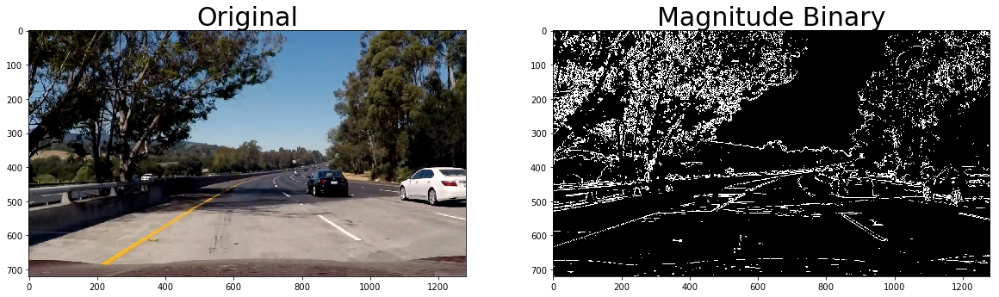

In [155]:
def sobel_mag_binary(img, sobel_kernel=3, thresh=(30, 100)):
    r = img[:, :, 0]
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(r, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(r, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude 
    mag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(mag)/255
    mag = (mag/scale_factor).astype(np.uint8)
    
    # Create a binary mask where mag thresholds are met
    binary_output = binary_thresh(mag, thresh)
    
    # Return this mask as your binary_output image
    return binary_output

des = sobel_mag_binary(img)
plot_images([img, des], ['Original', 'Magnitude Binary'], 'bin_mag.jpg')

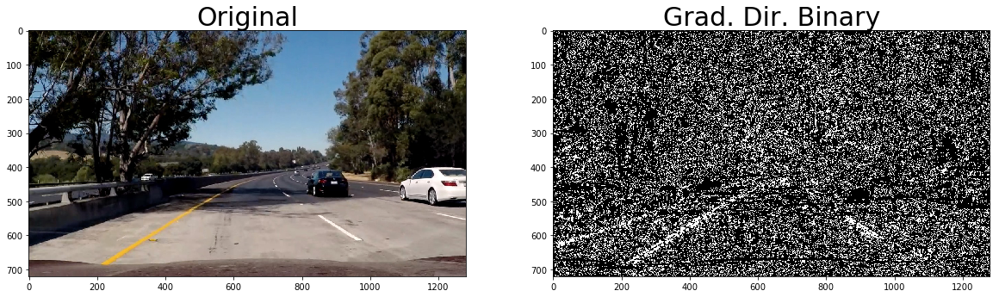

In [156]:
def sobel_dir_binary(img, sobel_kernel=9, thresh=(0.9, 1.3)):
    r = img[:, :, 0]
    
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(r, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(r, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # Create a binary mask where direction thresholds are met
    # Return this mask as your binary_output image
    binary_output = binary_thresh(absgraddir, thresh)
    
    return binary_output

des = sobel_dir_binary(img)
plot_images([img, des], ['Original', 'Grad. Dir. Binary'], 'bin_dir.jpg')

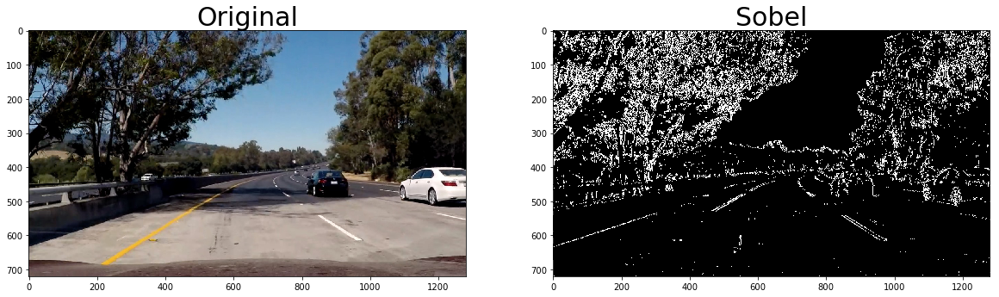

In [157]:
def sobel_binary(img):
    gradx_params = {'thresh': (20, 100), 'ksize': 3}
    grady_thresh = {'thresh': (200, 255), 'ksize': 3}
    mag_thresh = {'thresh': (30, 100), 'ksize': 3}
    dir_thresh = {'thresh': (0.9, 1.3), 'ksize': 3}
    
    gradx_bin = sobel_abs_grad_binary(img, orient='x', sobel_kernel=gradx_params['ksize'], thresh=gradx_params['thresh'])
    grady_bin = sobel_abs_grad_binary(img, orient='x', sobel_kernel=grady_thresh['ksize'], thresh=grady_thresh['thresh'])
    mag_bin = sobel_mag_binary(img, sobel_kernel=mag_thresh['ksize'], thresh=mag_thresh['thresh'])
    dir_bin = sobel_dir_binary(img, sobel_kernel=dir_thresh['ksize'], thresh=dir_thresh['thresh'])
    
    combined = np.zeros_like(gradx_bin)
    combined[((gradx_bin == 1)) | ((mag_bin == 1) & (dir_bin == 1))] = 1
    return combined

# test and plot
des = sobel_binary(img)

plot_images([img, des], ['Original', 'Sobel'], 'combined_sobel.jpg')

### Combine color and sobel binaries into single binary image for lane finding

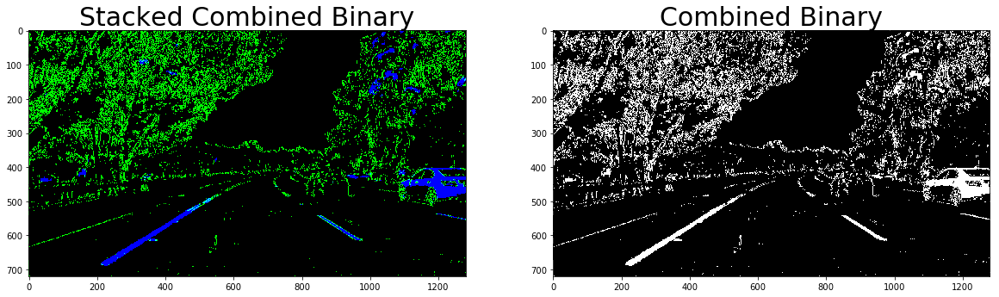

In [211]:
def comb_binary(img):
    sobel_bin = sobel_binary(img)
    color_bin = color_binary(img)
    img_bin = np.zeros_like(sobel_bin)
    img_bin[(sobel_bin==1) | (color_bin==1)] = 255
    return img_bin

sobel_bin = sobel_binary(img)
color_bin = color_binary(img)

stacked_out = np.dstack((np.zeros_like(sobel_bin), sobel_bin, color_bin))*255

binary_out = comb_binary(img)

# Plot the result
plot_images([stacked_out, binary_out], ['Stacked Combined Binary', 'Combined Binary'], 'bin_combined.jpg')

---
## Next, I'll use perspecitve transform to give us a bird's eye view of the lane lines

### Investigate image of staright lane lines to define four points depicting a trapezoid region for transform

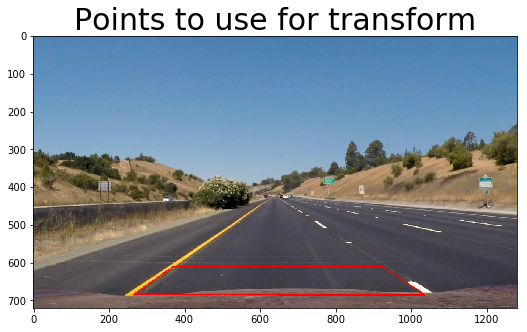

In [136]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
%matplotlib inline

img_size = (img.shape[1], img.shape[0])

pts = [
    (265, 684),
    (370, 610),
    (923, 610),
    (1035, 685)
]

img = mpimg.imread('./test_images/straight_lines1.jpg')
undist = undistort(img)
reg_img = draw_region(img, pts, lwidth=2)

f, ax = plt.subplots(figsize=(10,5))

ax.imshow(reg_img)
ax.set_title('Points to use for transform', fontsize=30)

f.savefig('./writeup_imgs/region_of_interest.jpg')

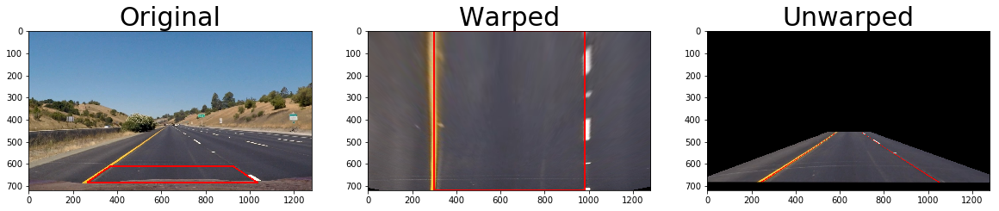

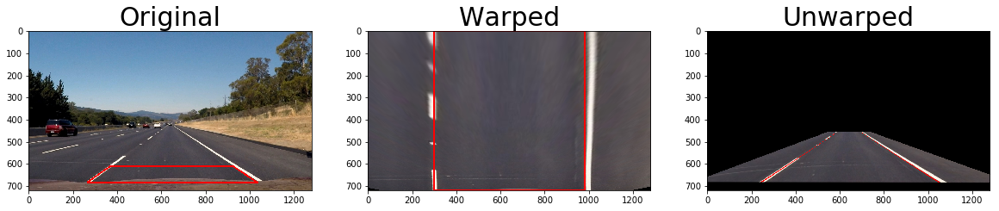

In [163]:
def get_M(img, pts, offset=300):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32(pts)
    
    dst = np.float32(
        [(offset, img_size[1]),
         (offset, 675), 
         (img_size[0]-offset, 675), 
         (img_size[0]-offset, img_size[1]), 
         ])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv

def warp(img, M):
    undist = undistort(img)
    return cv2.warpPerspective(undist, M, img_size, flags=cv2.INTER_LINEAR)

images = glob.glob('./test_images/straight_lines*.jpg')

offset = 300
M, Minv = get_M(img, pts, offset)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = draw_region(warp(img, M), 
                         [(offset, 0), 
                          (img_size[0]-offset, 0), 
                          (img_size[0]-offset, img_size[1]), 
                          (offset, img_size[1])])
    unwarped = warp(warped, Minv)
    plot_images([draw_region(img,pts), warped, unwarped],
                ['Original', 'Warped', 'Unwarped'],
                'straight_warped'+str(idx+1)+'.jpg')

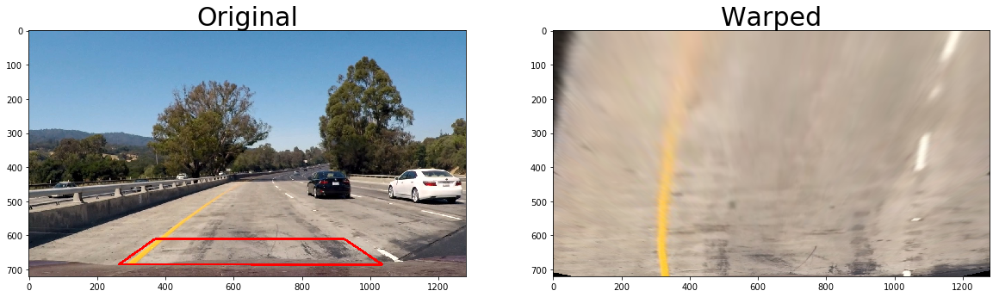

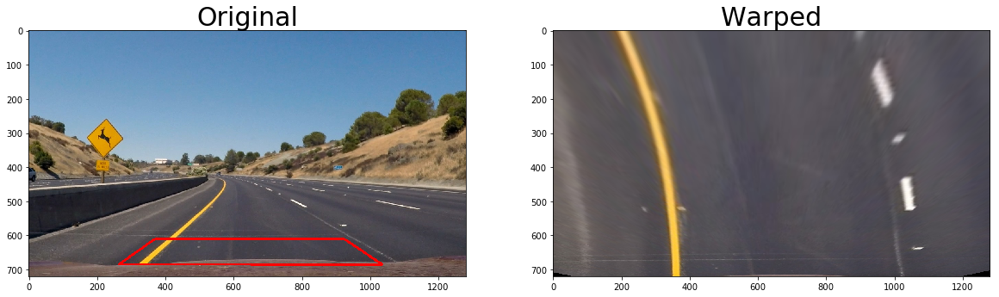

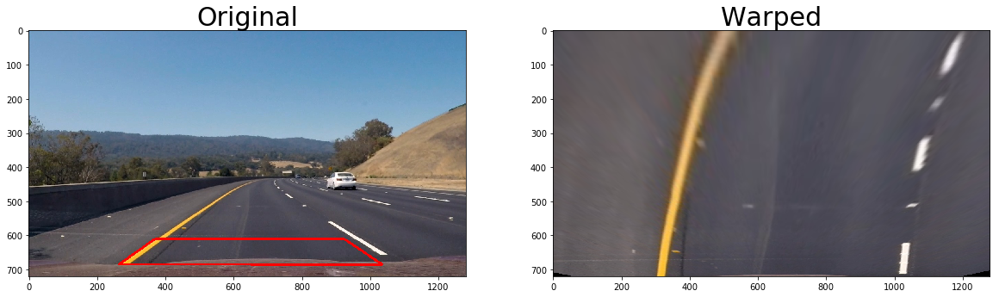

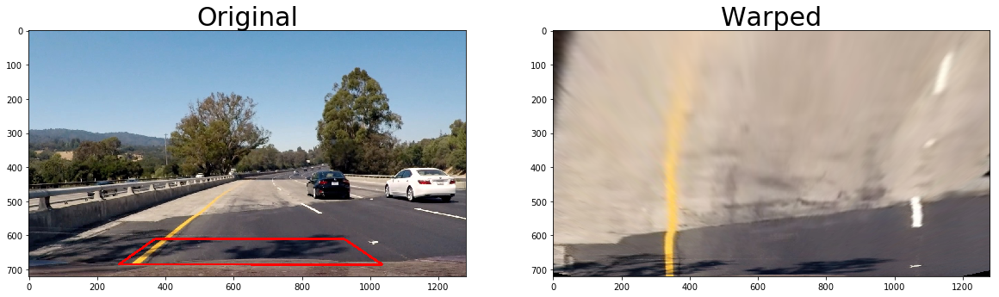

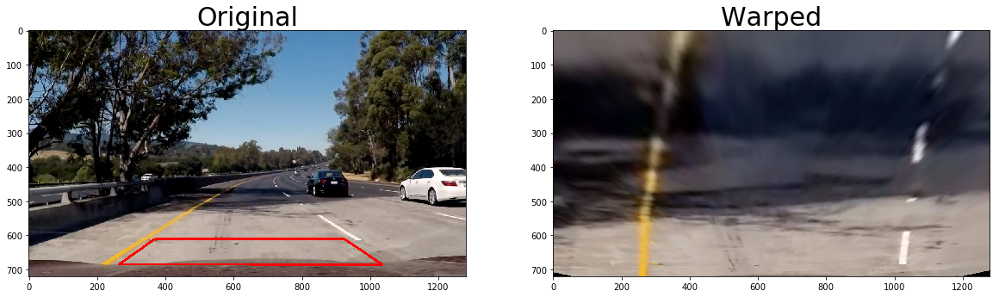

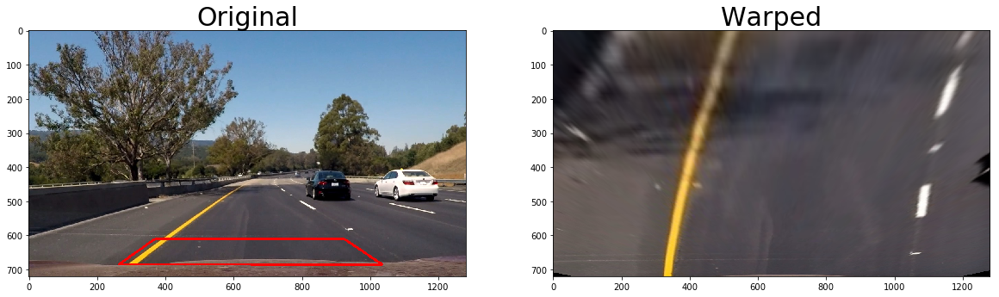

In [164]:
import glob
images = glob.glob('./test_images/test*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = warp(img,M)
    plot_images([draw_region(img,pts),warped],['Original','Warped'], 'warped'+str(idx+1)+'.jpg')

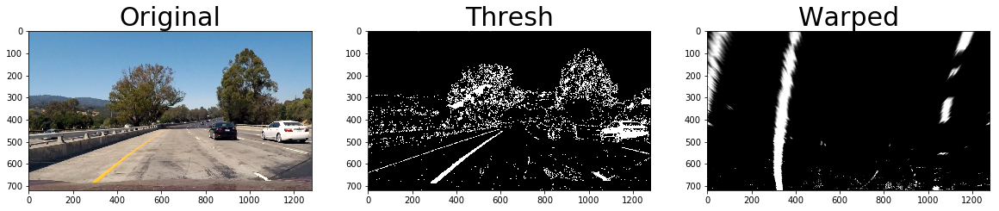

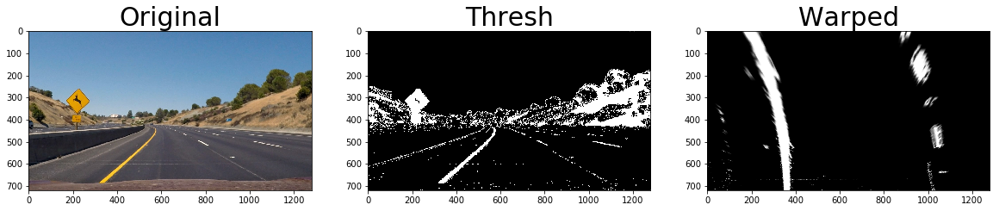

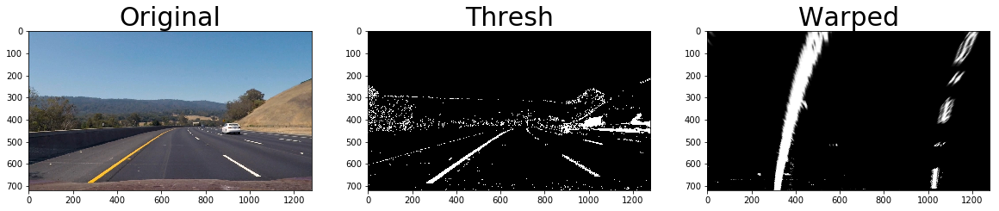

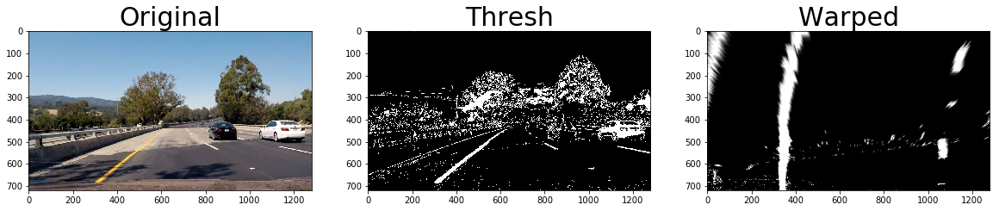

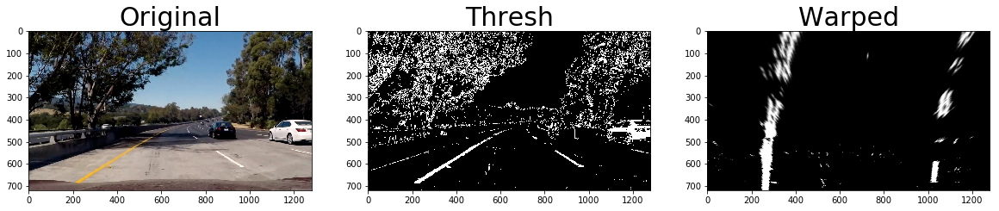

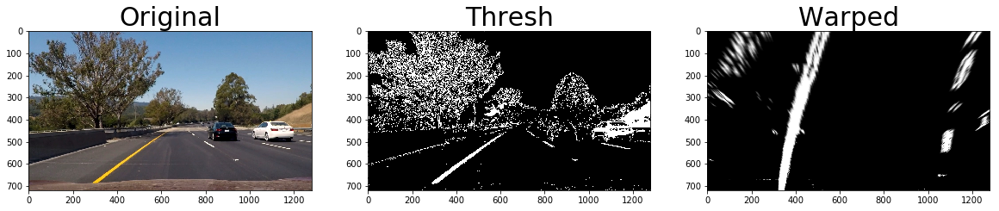

In [165]:
import glob
images = glob.glob('./test_images/test*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    img_bin = comb_binary(img)
    warped = warp(img_bin,M)
    
    plot_images([img,img_bin,warped],['Original','Thresh','Warped'], 'thresh_warped'+str(idx+1)+'.jpg')

---
## Then I'll use the bird's eye view to find the lane lines

### Practice finding lane lines on one of the images

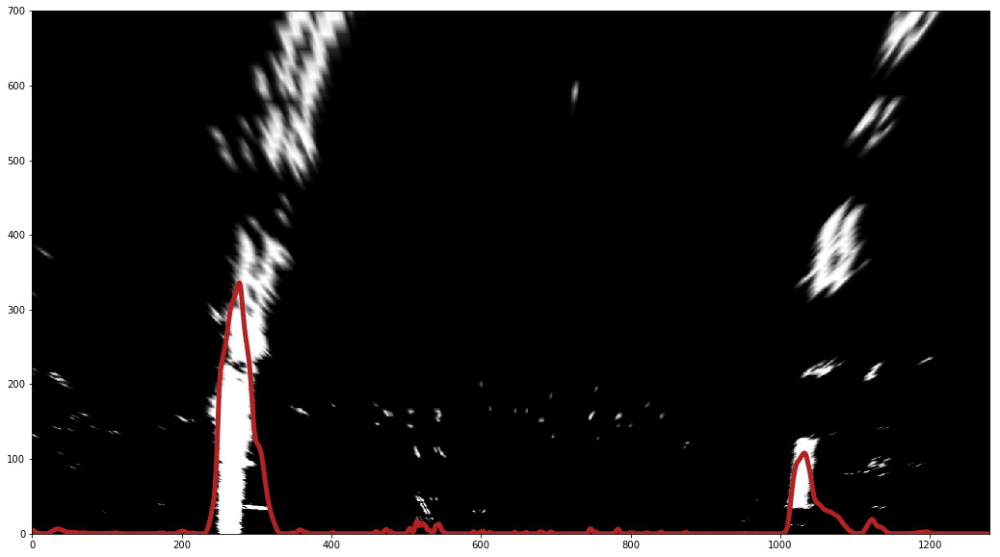

In [212]:
import numpy as np

img = mpimg.imread('./test_images/test5.jpg')
M, Minv = get_M(img, pts, offset)
    
img_bin = comb_binary(img)
warped = warp(img_bin,M)

histogram = np.sum(warped[warped.shape[0]//2:,:]/255, axis=0)

f, ax = plt.subplots(figsize=(50,10))
x = range(350)
ax.imshow(warped, extent=[0,img.shape[1],0,700], cmap='gray')
ax.plot(histogram, color='firebrick', linewidth=5.0)
f.savefig('./writeup_imgs/histogram.jpg')

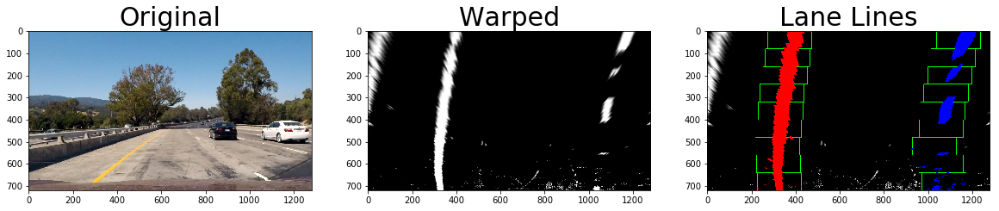

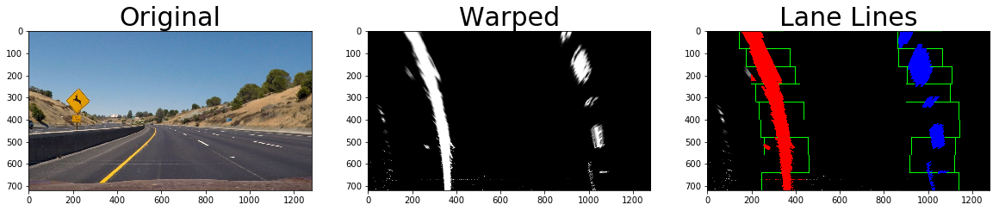

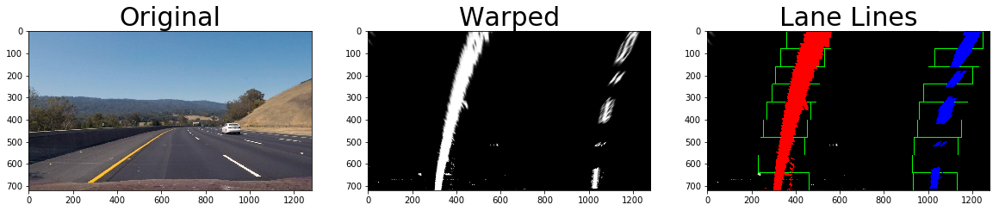

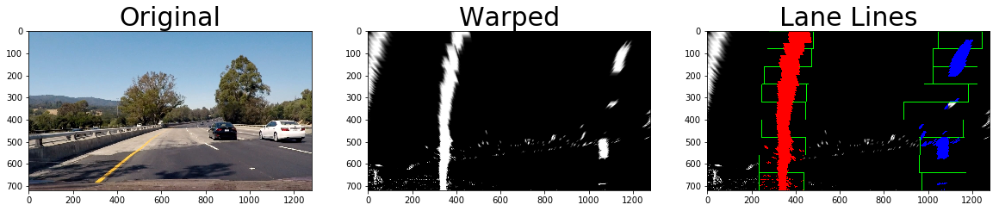

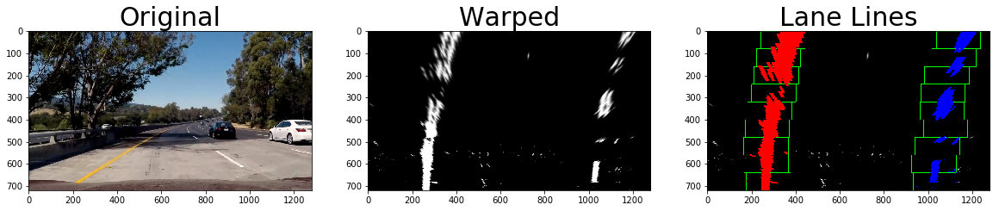

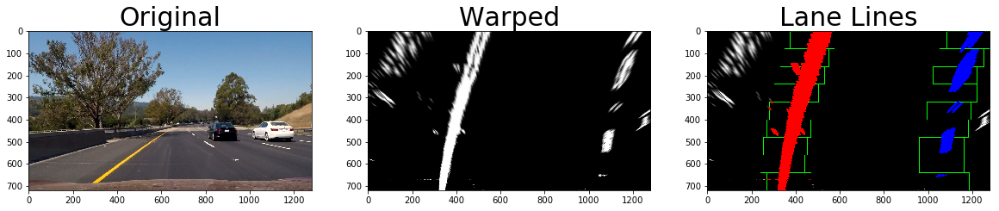

In [216]:
def find_lane_lines(img, nwindows=9, window_margin=100, minpix=50):
    out_img = np.array(cv2.merge((img, img, img)), np.uint8)
    
    histogram = np.sum(img[img.shape[0]//2:, :], axis=0)
    
    midpoint = np.int(histogram.shape[0]/2)
    window_height = np.int(img.shape[0]/nwindows)
    
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    cur_leftx = np.argmax(histogram[:midpoint])
    cur_rightx = np.argmax(histogram[midpoint:]) + midpoint
    
    left_idxs = []
    right_idxs = []
    
    for window in range(nwindows):
        y_low = img.shape[0] - (window+1)*window_height
        y_high = img.shape[0] - window*window_height
        xleft_low = cur_leftx - window_margin
        xleft_high = cur_leftx + window_margin
        xright_low = cur_rightx - window_margin
        xright_high = cur_rightx + window_margin

        cv2.rectangle(out_img, (xleft_low, y_low), (xleft_high, y_high), (0,255,0), 2) 
        cv2.rectangle(out_img, (xright_low, y_low), (xright_high, y_high), (0,255,0), 2) 

        good_left_idxs = ((nonzeroy >= y_low) 
                          & (nonzeroy < y_high) 
                          & (nonzerox >= xleft_low) 
                          & (nonzerox < xleft_high)).nonzero()[0]
        
        good_right_idxs = ((nonzeroy >= y_low) 
                           & (nonzeroy < y_high) 
                           & (nonzerox >= xright_low) 
                           & (nonzerox < xright_high)).nonzero()[0]
        
        left_idxs.append(good_left_idxs)
        right_idxs.append(good_right_idxs)

        if len(good_left_idxs) > minpix:
            cur_leftx = np.int(np.mean(nonzerox[good_left_idxs]))
            
        if len(good_right_idxs) > minpix:        
            cur_rightx = np.int(np.mean(nonzerox[good_right_idxs]))
        
    
    # Concatenate the arrays of indices
    left_idxs = np.concatenate(left_idxs)
    right_idxs = np.concatenate(right_idxs)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_idxs]
    lefty = nonzeroy[left_idxs] 
    rightx = nonzerox[right_idxs]
    righty = nonzeroy[right_idxs] 

    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    
    return [lefty, leftx], [righty, rightx], out_img

import glob
images = glob.glob('./test_images/test*.jpg')

M, Minv = get_M(img,pts)
for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    bin_img = comb_binary(img)
    warped = warp(bin_img, M)
    left, right, lines = find_lane_lines(warped)

    left_fit = np.polyfit(left[0], left[1], 2)
    right_fit = np.polyfit(right[0], right[1], 2)

    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
    left_fitx = np.array(left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2], np.int32)
    right_fitx = np.array(right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2], np.int32)
    
    plot_images([img, warped, lines],
                ['Original', 'Warped', 'Lane Lines'])
    

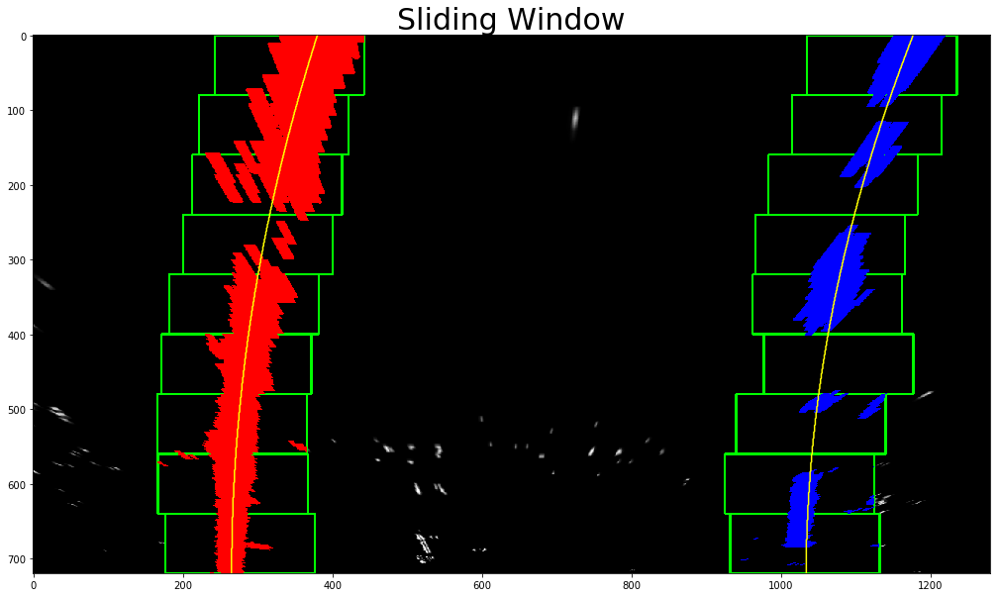

In [220]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

img = mpimg.imread('./test_images/test5.jpg')
M, Minv = get_M(img, pts)

bin_img = comb_binary(img)
warped = warp(bin_img, M)
left, right, lines = find_lane_lines(warped)

left_fit = np.polyfit(left[0], left[1], 2)
right_fit = np.polyfit(right[0], right[1], 2)

ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0])
left_fitx = np.array(left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2], np.int32)
right_fitx = np.array(right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2], np.int32)

out_img[left[0], left[1]] = [255, 0, 0]
out_img[right[0], right[1]] = [0, 0, 255]

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(lines, cmap='gray')
ax.plot(left_fitx, ploty, color='yellow')
ax.plot(right_fitx, ploty, color='yellow')
ax.set_title('Sliding Window', fontsize=30)
f.savefig('./writeup_imgs/sliding_window.jpg')

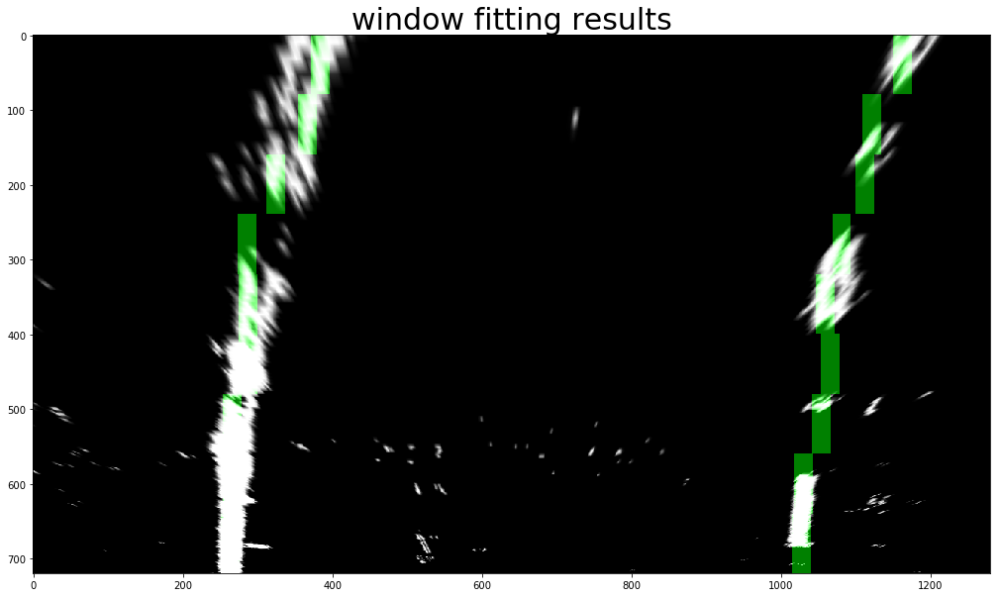

In [170]:
# window settings
window_width = 25 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 50 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(warped, window_width, window_height, margin):
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
        l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
        r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)
    
    leftx = []
    rightx = []

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        # Window_mask is a function to draw window areas
        leftx.append(window_centroids[level][0])
        rightx.append(window_centroids[level][1])
        
        l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
        r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
        # Add graphic points from window mask here to total pixels found 
        l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
        r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channel
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results)
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped*255,warped*255,warped*255)),np.uint8)

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(output)
ax.set_title('window fitting results', fontsize=30)


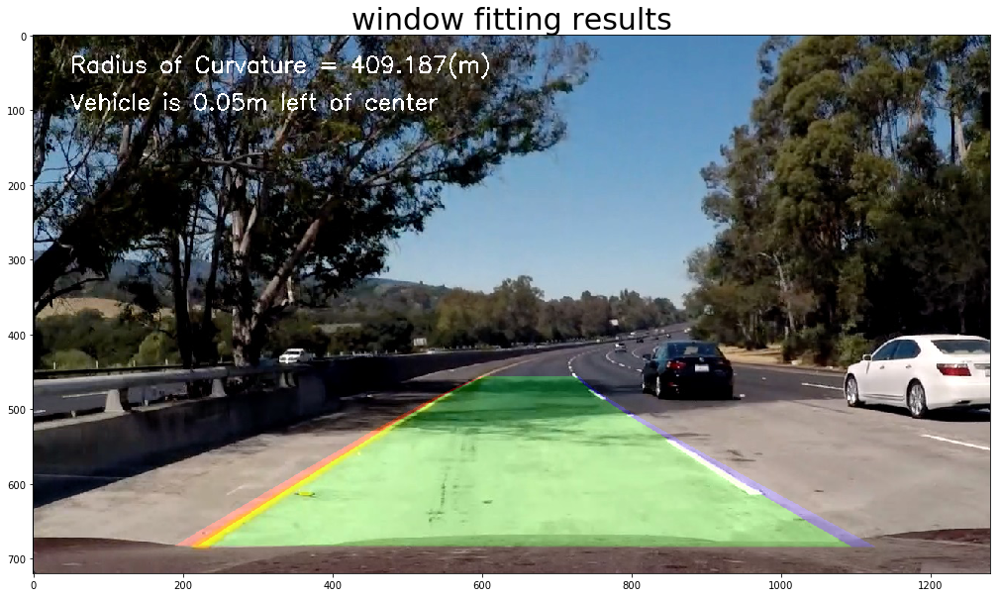

In [171]:
ym_per_pix = 30./720
xm_per_pix = 3.7/700

yvals = range(0, warped.shape[0])
res_yvals = np.arange(warped.shape[0]-(window_height/2), 0, -window_height)

left_fit = np.polyfit(res_yvals, leftx, 2)
left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
left_fitx = np.array(left_fitx, np.int32)

right_fit = np.polyfit(res_yvals, rightx, 2)
right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
right_fitx = np.array(right_fitx, np.int32)

left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, left_fitx[::-1]+window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2, right_fitx[::-1]+window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2, right_fitx[::-1]-window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)

road = np.zeros_like(img)
road_bkg = np.zeros_like(img)
cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
cv2.fillPoly(road,[inner_lane],color=[0,255,0])
#cv2.fillPoly(road_bkg,[left_lane],color=[255,255,255])
#cv2.fillPoly(road_bkg,[right_lane],color=[255,255,255])

road_warped = transform(road, Minv)
road_warped_bkg = transform(road_bkg, Minv)

base = cv2.addWeighted(img, 1.0, road_warped_bkg, -1.0, 0.0)
result = cv2.addWeighted(base, 1.0, road_warped, 0.25, 0.0)

curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix, 2)
curvead = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])

camera_center = (left_fitx[-1] + right_fitx[-1])/2
center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
side_pos = 'left'
if center_diff <= 0:
    side_pos = 'right'
    
cv2.putText(result, 'Radius of Curvature = '+str(round(curvead,3))+'(m)', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff, 3)))+'m '+side_pos+' of center', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

f, ax = plt.subplots(figsize=(20,10))
ax.imshow(result)
ax.set_title('window fitting results', fontsize=30)

In [175]:
def process_image(img):
    img_size = (img.shape[1], img.shape[0])
    
    offset_bot = (200,0)
    offset_top = (40,0)

    pt1 = [img_size[0]/2-offset_top[0],445] #[img.shape[1]*(.5-top_x/2),img.shape[0]*top_y]
    pt2 = [img_size[0]/2+offset_top[0],445] #[img.shape[1]*(.5+top_x/2),img.shape[0]*top_y]
    pt3 = [img_size[0] - offset_bot[0],720] #[img.shape[1]*(.5+bottom_x/2),img.shape[0]*bottom_y]
    pt4 = [offset_bot[0],720] #[img.shape[1]*(.5-bottom_x/2),img.shape[0]*bottom_y]
    
    M, Minv = get_M(img,pts)
    
    sobel_bin = sobel_binary(img)
    color_bin = color_binary(img)
    img_bin = np.zeros_like(sobel_bin)
    img_bin[(sobel_bin==1) | (color_bin==1)] = 255
    
    warped = warp(img_bin,M)
    
    # window settings
    window_width = 25 
    window_height = 80 
    margin = 50 
    
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    
    if len(window_centroids) > 0:
        leftx = []
        rightx = []

        for level in range(0,len(window_centroids)):
            leftx.append(window_centroids[level][0])
            rightx.append(window_centroids[level][1])
        
    ym_per_pix = 10/720
    xm_per_pix = 5/400

    yvals = range(0, warped.shape[0])
    res_yvals = np.arange(warped.shape[0]-(window_height/2), 0, -window_height)

    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals + left_fit[2]
    left_fitx = np.array(left_fitx, np.int32)

    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals + right_fit[2]
    right_fitx = np.array(right_fitx, np.int32)

    left_lane = np.array(list(zip(np.concatenate((left_fitx-window_width/2, left_fitx[::-1]+window_width/2), axis=0),
                                  np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    right_lane = np.array(list(zip(np.concatenate((right_fitx-window_width/2, right_fitx[::-1]+window_width/2), axis=0),
                                  np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)
    inner_lane = np.array(list(zip(np.concatenate((left_fitx+window_width/2, right_fitx[::-1]-window_width/2), axis=0),
                              np.concatenate((yvals,yvals[::-1]), axis=0))), np.int32)

    road = np.zeros_like(img)
    cv2.fillPoly(road,[left_lane],color=[255, 0, 0])
    cv2.fillPoly(road,[right_lane],color=[0, 0, 255])
    cv2.fillPoly(road,[inner_lane],color=[0,255,0])
    road_warped = transform(road, Minv)
    result = cv2.addWeighted(img, 1.0, road_warped, 0.75, 0.0)

    curve_fit_cr = np.polyfit(np.array(res_yvals,np.float32)*ym_per_pix, np.array(leftx,np.float32)*xm_per_pix, 2)
    curvead = ((1 + (2*curve_fit_cr[0]*yvals[-1]*ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])

    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-warped.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'

    cv2.putText(result, 'Radius of Curvature = '+str(round(curvead,3))+'(m)', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Vehicle is '+str(abs(round(center_diff, 3)))+'m '+side_pos+' of center', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    
    return result

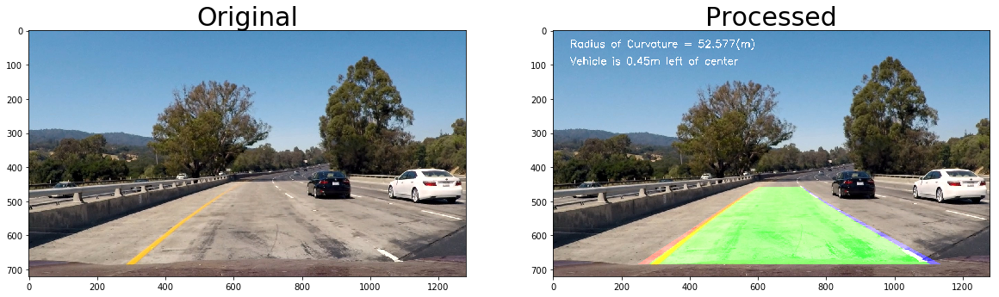

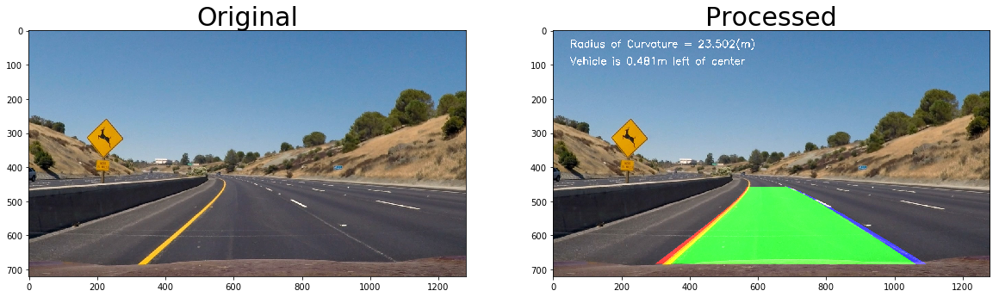

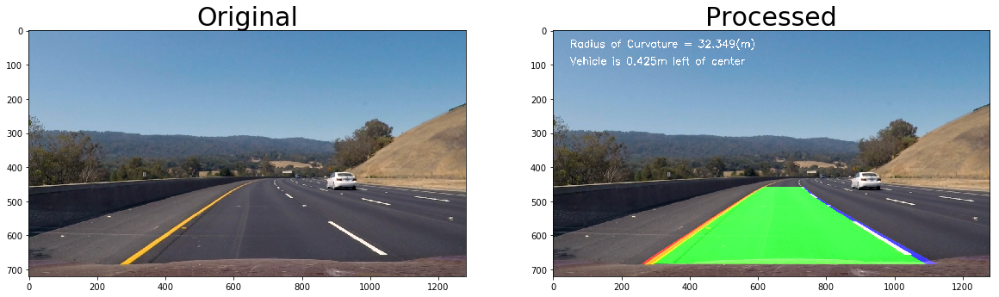

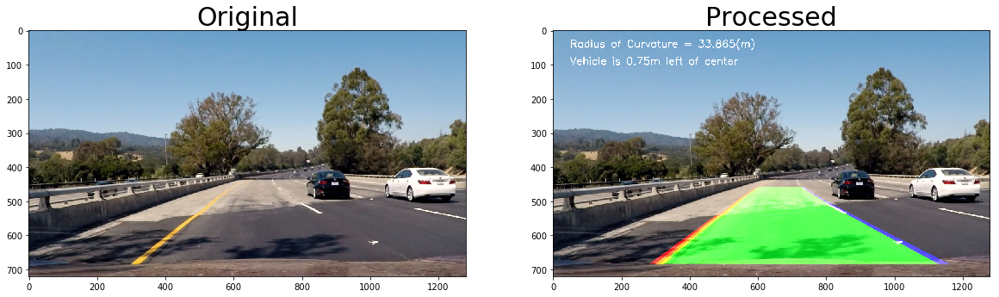

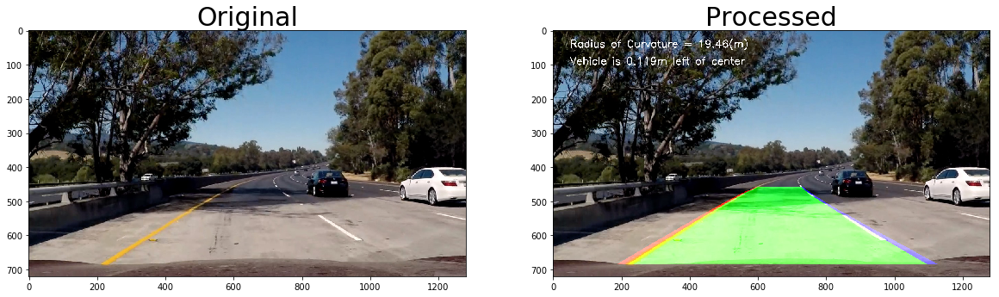

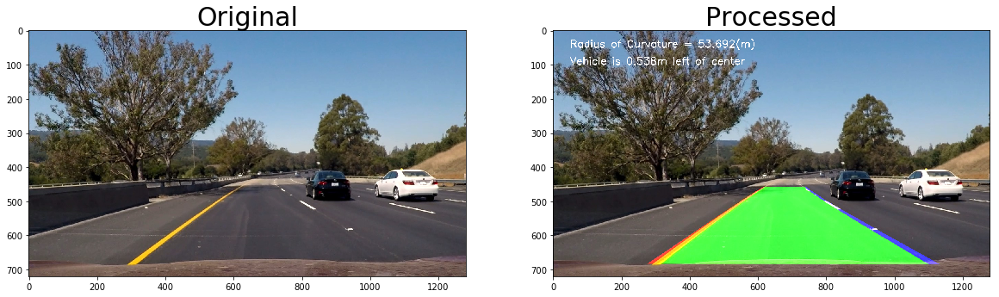

In [176]:
import glob
images = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(images):
    img = mpimg.imread(fname)
    warped = process_image(img)
    plot_images([img, warped],['Original', 'Processed'], 'processed'+str(idx+1)+'.jpg')

In [25]:
from moviepy.editor import VideoFileClip

project_vid = 'project_video.mp4'
output_vid = 'project_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████████████████████████████████▉| 1260/1261 [05:10<00:00,  4.20it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

Wall time: 5min 11s


In [26]:
from moviepy.editor import VideoFileClip

project_vid = 'challenge_video.mp4'
output_vid = 'challenge_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|████████████████████████████████████████| 485/485 [01:57<00:00,  4.05it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

Wall time: 1min 58s


In [27]:
from moviepy.editor import VideoFileClip

project_vid = 'harder_challenge_video.mp4'
output_vid = 'harder_challenge_video_out.mp4'

clip = VideoFileClip(project_vid)
vid_clip = clip.fl_image(process_image)
%time vid_clip.write_videofile(output_vid, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████████████████████████████████▉| 1199/1200 [04:57<00:00,  4.00it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

Wall time: 4min 58s
